In [12]:
# Standard library imports
import sys
from pathlib import Path
import random
from typing import Tuple, Union, List, Dict, Optional
from matplotlib.collections import PolyCollection
import matplotlib.pyplot as plt
from pathlib import Path

# Local module imports
sys.path.insert(0, '../src')
from sg_utils.config.xenium_breast import *
from sg_utils.tl.xenium_utils import *
from sg_utils.pl.plot_segmentation import *

In [2]:
methods = ['10X_cell', '10X_nucleus', 'segger', 'Baysor' , 'BIDCell']

data_path = Path('../data/xenium_breast/labeled_transcripts')

ome_tiff_path = Path(data_path) / "morphology_mip.ome.tif"

In [3]:
txs = {}
for method in methods:
    txs[method] = pd.read_parquet(data_path / f"labeled_transcripts_{method}.parquet")

/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 12/12 [00:00<00:00, 19.17it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 11/11 [00:00<00:

A linearring requires at least 4 coordinates. [[0, 2]]


/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 11/11 [00:00<00:00, 35.75it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (61) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 61/61 [00:00<00:

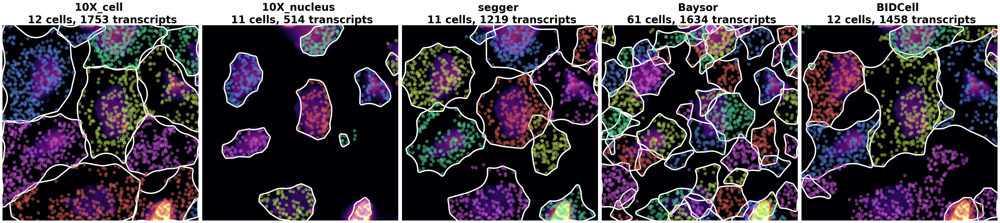

In [5]:
# Define zoom-in coordinates
xlim, ylim = (2120, 2170), (3020, 3070)

# Create a grid of subplots
fig, axes = plt.subplots(1, 5, figsize=(40, 8.5))

# Iterate through methods and plot segmentation
for method, ax in zip(methods, axes.flatten()):
    seg_col = 'cell_id' if method in ['10X_cell', '10X_nucleus', 'BIDCell'] else f"{method.lower()}_cell_id"

    # Plot segmentation
    cells, tx, bs = plot_segmentation_advanced(
        transcripts=txs[method],
        ome_tiff_path=ome_tiff_path,
        x="x_location",
        y="y_location",
        seg_col=seg_col,
        marker_col="marker_type",
        type_color='c',
        ax=ax,
        s=100,
        boundaries=True,
        marker_colors=extended_colors,
        xlim=xlim,
        ylim=ylim,
        boundary_styles={'linewidths':4}
    )
    ax.set_aspect('equal')
    ax.axis('off')
    # Set title with method name and segmentation stats
    ax.set_title(f"{method} \n {cells} cells, {tx} transcripts", 
                 fontsize=30, fontweight='bold')

# Adjust layout and save the figure
plt.tight_layout()
plt.show()

/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (17) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 17/17 [00:00<00:00, 51.76it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:296: UserWarning: 
The palette list has fewer values (5) than needed (17) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
100%|██████████| 17/17 [00:00<00:

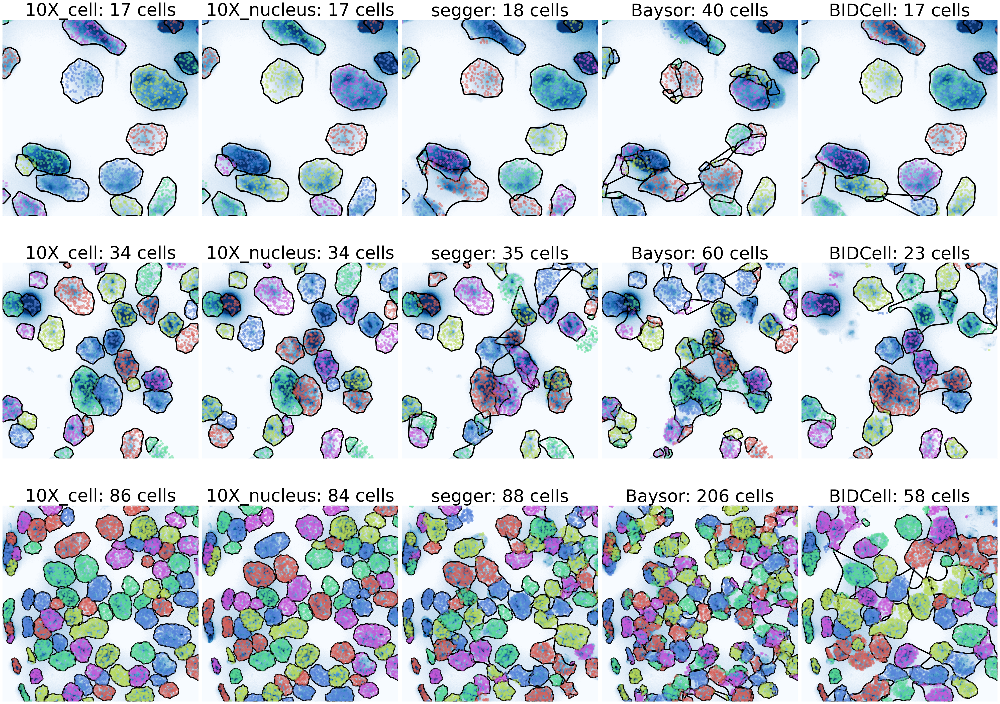

In [7]:
# Define zoom-in coordinates
lims = [[(4345, 4390), (470, 515)], [(3200, 3270), (1870, 1940)], [(6120, 6220), (4180, 4280)]]

# Create a grid of subplots for better visualization
fig, axes = plt.subplots(len(lims), 5, figsize=(40, 10 * len(lims)))

j = 0
for lim in lims:
    axes_row = axes[j,:]
    # axes_row = axes[j]
    # Iterate through methods and plot
    for method, ax in zip(methods, axes_row.flatten()):
        if method in ['10X_cell', '10X_nucleus', 'BIDCell']:
            seg_col = 'cell_id'
        else:
            seg_col = f"{method.lower()}_cell_id"
        cells, tx, bd = plot_segmentation_advanced(
            transcripts=txs[method][txs[method].overlaps_nucleus == 1],
            ome_tiff_path=ome_tiff_path,
            x="x_location",
            y="y_location",
            seg_col=seg_col,
            marker_col="marker_type",
            type_color='c',
            ax=ax,
            s=50,
            # Uncomment the line below if boundaries are provided
            boundaries=True,
            boundary_styles=  {'edgecolor': 'black', 'linewidths':4},
            marker_colors=extended_colors,
            xlim=lim[0],
            ylim=lim[1],
            cmap='Blues'
        )
        ax.set_aspect('equal')
        ax.axis('off')
        ax.set_title(f"{method}: {cells} cells", fontsize=50)
    j += 1

# Show the plot
plt.tight_layout()
plt.show()

100%|██████████| 60/60 [00:01<00:00, 41.86it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
100%|██████████| 47/47 [00:00<00:00, 112.68it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
100%|██████████| 50/50 [00:00<00:00, 90.22it/s]
/Users/b450-admin/Desktop/Projects/elyas_proj/projects_2024/segger_final/segger-analysis/notebooks/../src/sg_utils/pl/plot_segmentation.py:332: UserWarning: No artists with labels f

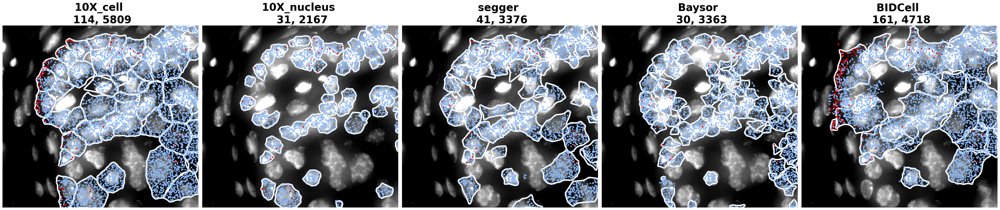

In [11]:
# Define zoom-in coordinates
xlim, ylim = (1750, 1850), (2850, 2950)

# Create a grid of subplots
fig, axes = plt.subplots(1, 5, figsize=(40, 8.5))

# Define transcript styles
transcript_styles = dict(alpha=1, lw=0, legend=False, rasterized=True)

# Iterate through segmentation methods and plot
for method, ax in zip(methods, axes.flatten()):
    seg_col = 'cell_id' if method in ['10X_cell', '10X_nucleus', 'BIDCell'] else f"{method.lower()}_cell_id"
    transcripts = txs[method]
    
    x="x_location"
    y="y_location"
    
    transcripts = transcripts[
        ((transcripts[x] >= xlim[0]) & (transcripts[x] <= xlim[1]) &
        (transcripts[y] >= ylim[0]) & (transcripts[y] <= ylim[1]))
    ]

    # Filter transcripts based on cell type and marker features
    epithelial_mask = transcripts.cell_type == 'Normal Epithelial'
    marker_mask = transcripts.feature_name.isin(['POSTN', 'LUM', 'MMP2'])
    transcripts = transcripts[epithelial_mask | marker_mask]

    # Calculate statistics
    total = epithelial_mask.sum()
    total_other = marker_mask.sum() - epithelial_mask[marker_mask].sum()
    
    # Annotate transcripts
    transcripts["FP"] = marker_mask & epithelial_mask
    transcripts["size"] = transcripts["FP"].astype(int) * 100 + (~transcripts["FP"]).astype(int) * 2
    transcripts["color"] = "1"
    transcripts.loc[marker_mask, "color"] = "2"
    transcripts.loc[transcripts["FP"], "color"] = "3"
    transcripts.sort_values("color", inplace=True)

    # Remove certain markers from the plot
    transcripts = transcripts[transcripts.color != "2"]
    FP_count = transcripts["FP"].sum()

    # Plot segmentation using the refactored function
    cells, tx, bd = plot_segmentation_advanced(
        transcripts=transcripts,
        ome_tiff_path=ome_tiff_path,
        x="x_location",
        y="y_location",
        seg_col=seg_col,
        type_color='m',
        ax=ax,
        s=1000,
        cmap='gist_gray',
        boundaries=True,
        boundary_styles=  {'edgecolor': 'w', 'linewidths':4},
        xlim=xlim,
        ylim=ylim,
        transcript_styles=transcript_styles,
        marker_col='color',
        marker_colors={'3': '#E00000', '1': '#8bb7f4'},
    )

    # Remove axes and set title
    ax.axis('off')
    ax.set_title(f"{method} \n {FP_count}, {total - FP_count}", fontsize=30, fontweight='bold')

# Adjust layout and save the figure
plt.tight_layout()
plt.show()